# RAVENPACK

## RavenPack Data Science Challenge

Dataset (in csv format) with the following structure (column wise):

- DATE: A given date
- RP_ENTITY_ID: An asset ID.
- T0_RETURN: Return on the given date.
- T1_RETURN: Next day Return.
- A set of 36 different Indicators (Features)

 
The aim of this project is to come up with a model/algorithm to produce **<u>predictions on T1_RETURN</u>** using the available information. 

You are expected to use said predictions to form a portfolio that will then be evaluated according to **Information Ratio**. 


As an output, you are asked to provide:

- A short report on what you have done together with some results and conclusions, including a performance comparison among the models you propose, using Information Ratio as a metric.

- The source code used for producing your analysis and results.

The project will allow us to evaluate your skill set within programming, data preparation, modeling, and communication. 
You have 1 week to finish the project, but in case you require of additional time please let us know.

 
links to the files :

https://drive.google.com/a/rav...

https://drive.google.com/a/rav...

In [1]:
#################################
#######  SAMPLE CODE   ##########
#################################
library(data.table)
# Open CSV file and convert to data table
# Full path to your csv file
fullPath = <The path to the provided csv file goes here>
DataSet = data.table(read.csv(file = fullPath))
# We have a panel data.table with information about dates, Entity IDs, Returns (T1 and T0), and 36 different indicators).


# Example on how to check the performance of a given prediction.
# Lets say we are using the sign of an indicator(GROUP_E_ALL_SG90) as predictor
# We select only the data we are interested in
PredictionData = subset(DataSet, select = c('DATE', 'RP_ENTITY_ID','GROUP_E_ALL_SG90', 'T1_RETURN'))
# We drop NA's
PredictionData = PredictionData[complete.cases(PredictionData)]
# We get unique rows
PredictionData = unique(PredictionData)
# We sort by DATE, setting its key
setkey(PredictionData,'DATE')
# Compute Average Return per day using the sign of the indicator as predictor
PredictionData[, AVGRET:= mean(sign(GROUP_E_ALL_SG90)*T1_RETURN,na.rm = TRUE), by = c('DATE')]
Results = subset(PredictionData,select = c('DATE','AVGRET'))
Results = unique(Results)
# We plot the Cummulative Log Returns
plot( as.Date(Results$DATE), cumsum(log(Results$AVGRET+1)), t = 'l', col = 'blue', ylab = 'Cummulative Return', xlab = 'DATE')
# Some Stats
# AnnualizedReturn
AnnualizedReturn = mean(log(Results$AVGRET+1))*252 
# AnnualizedVolatility 
AnnualizedVolatility = sqrt(var(log(Results$AVGRET+1)))*sqrt(252)
#↓ Information Ratio     
InformationRatio = AnnualizedReturn/AnnualizedVolatility
title(paste('Return Profile - Information Ratio', round(InformationRatio,2)))

SyntaxError: invalid syntax (<ipython-input-1-f22953fc8fc4>, line 7)

In [205]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from IPython.core.display import display, HTML
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [206]:
display(HTML("<style> *{margin:0; padding:0;} html, body, \
             .container{margin:2;!important padding:0;!important} \
             .container { width:100% !important;}</style>"))


In [207]:
df = pd.read_csv('./SampleDataSet.csv')

In [6]:
df.head(60)
df.tail(60)

,DATE,RP_ENTITY_ID,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,...,GROUP_AM_HEAD,GROUP_AM_BODY,GROUP_AM_ALL_SG90,GROUP_AM_HEAD_SG90,GROUP_AM_BODY_SG90,GROUP_AM_ALL_SG365,GROUP_AM_HEAD_SG365,GROUP_AM_BODY_SG365,T0_RETURN,T1_RETURN
1764764,2017-02-17,E49AA3,0.263333,NaN,0.305000,NaN,NaN,NaN,NaN,NaN,...,NaN,0.305000,NaN,NaN,NaN,NaN,NaN,NaN,0.006505,NaN
1764765,2017-02-17,E49AA3,0.263333,NaN,0.305000,0.610000,NaN,0.610,0.610000,NaN,...,NaN,0.305000,NaN,NaN,NaN,NaN,NaN,NaN,0.006505,NaN
1764766,2017-02-17,E49AA3,0.263333,0.180000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.006505,NaN
1764767,2017-02-17,E4CE73,0.157500,0.326522,NaN,0.335652,0.493077,NaN,0.390000,0.475833,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009608,NaN
1764768,2017-02-17,E4CE73,0.157500,NaN,0.039697,0.335652,NaN,0.131,0.390000,NaN,...,NaN,0.039697,NaN,NaN,NaN,NaN,NaN,NaN,-0.009608,NaN
1764769,2017-02-17,E4CE73,0.157500,NaN,0.039697,0.335652,NaN,0.131,NaN,NaN,...,NaN,0.039697,NaN,NaN,NaN,NaN,NaN,NaN,-0.009608,NaN
1764770,2017-02-17,E4CE73,0.157500,NaN,0.039697,NaN,NaN,NaN,NaN,NaN,...,NaN,0.039697,NaN,NaN,NaN,NaN,NaN,NaN,-0.009608,NaN
1764771,2017-02-17,E4CE73,0.157500,0.326522,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009608,NaN
1764772,2017-02-17,E4CE73,0.157500,0.326522,NaN,0.335652,0.493077,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009608,NaN
1764773,2017-02-17,E5D727,0.010000,0.010000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.047700,NaN


In [262]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1764824 entries, 0 to 1764823
Data columns (total 40 columns):
 #   Column               Dtype  
---  ------               -----  
 0   DATE                 object 
 1   RP_ENTITY_ID         object 
 2   GLOBAL_ALL           float64
 3   GLOBAL_HEAD          float64
 4   GLOBAL_BODY          float64
 5   GLOBAL_ALL_SG90      float64
 6   GLOBAL_HEAD_SG90     float64
 7   GLOBAL_BODY_SG90     float64
 8   GLOBAL_ALL_SG365     float64
 9   GLOBAL_HEAD_SG365    float64
 10  GLOBAL_BODY_SG365    float64
 11  GROUP_A_ALL          float64
 12  GROUP_A_HEAD         float64
 13  GROUP_A_BODY         float64
 14  GROUP_A_ALL_SG90     float64
 15  GROUP_A_HEAD_SG90    float64
 16  GROUP_A_BODY_SG90    float64
 17  GROUP_A_ALL_SG365    float64
 18  GROUP_A_HEAD_SG365   float64
 19  GROUP_A_BODY_SG365   float64
 20  GROUP_E_ALL          float64
 21  GROUP_E_HEAD         float64
 22  GROUP_E_BODY         float64
 23  GROUP_E_ALL_SG90     float64
 24

In [208]:
df['DATE'] = pd.to_datetime(df['DATE'])

In [209]:
descr = df.describe()
pd.options.display.max_columns = None
display(descr)

,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,GLOBAL_BODY_SG365,GROUP_A_ALL,GROUP_A_HEAD,GROUP_A_BODY,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GROUP_A_BODY_SG90,GROUP_A_ALL_SG365,GROUP_A_HEAD_SG365,GROUP_A_BODY_SG365,GROUP_E_ALL,GROUP_E_HEAD,GROUP_E_BODY,GROUP_E_ALL_SG90,GROUP_E_HEAD_SG90,GROUP_E_BODY_SG90,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GROUP_E_BODY_SG365,GROUP_AM_ALL,GROUP_AM_HEAD,GROUP_AM_BODY,GROUP_AM_ALL_SG90,GROUP_AM_HEAD_SG90,GROUP_AM_BODY_SG90,GROUP_AM_ALL_SG365,GROUP_AM_HEAD_SG365,GROUP_AM_BODY_SG365,T0_RETURN,T1_RETURN
count,1.764824e+06,661969.000000,1.102855e+06,878391.000000,374304.000000,504087.000000,690269.000000,306698.000000,383571.000000,464688.000000,274104.000000,1.102855e+06,261374.000000,174391.000000,86983.000000,228894.000000,151697.000000,77197.000000,803938.000000,264392.000000,1.102855e+06,405933.000000,146451.000000,259482.000000,298572.000000,111088.000000,187484.000000,0.0,0.0,1.102855e+06,0.0,0.0,0.0,0.0,0.0,0.0,1.762002e+06,1.758998e+06
mean,2.228388e-01,0.189778,2.407624e-01,0.202441,0.172764,0.226045,0.198085,0.168985,0.223448,0.105639,0.137964,2.407624e-01,0.110891,0.140222,0.049359,0.115602,0.147119,0.050983,0.108108,0.105423,2.407624e-01,0.114938,0.109754,0.115567,0.103354,0.091684,0.108981,NaN,NaN,2.407624e-01,NaN,NaN,NaN,NaN,NaN,NaN,3.264422e-04,-1.408236e-04
std,3.741778e-01,0.449429,3.561076e-01,0.393646,0.466463,0.365822,0.414940,0.483412,0.389471,0.567168,0.584229,3.561076e-01,0.563097,0.583875,0.541278,0.576636,0.597656,0.552625,0.321404,0.356829,3.561076e-01,0.333996,0.367305,0.340001,0.348356,0.374241,0.361705,NaN,NaN,3.561076e-01,NaN,NaN,NaN,NaN,NaN,NaN,3.782160e-02,2.432372e-02
min,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.990000,-0.990000,-1.000000e+00,-0.990000,-0.990000,-0.990000,-0.990000,-0.990000,-0.990000,-1.000000,-1.000000,-1.000000e+00,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,NaN,NaN,-1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,-9.107880e-01,-9.060107e-01
25%,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.380000,-0.217500,0.000000e+00,-0.340000,-0.180000,-0.580000,-0.386667,-0.193333,-0.580000,0.000000,0.000000,0.000000e+00,0.000000,-0.005714,0.000000,0.000000,-0.005339,0.000000,NaN,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,-9.993569e-03,-8.597890e-03
50%,2.440000e-01,0.176503,2.744444e-01,0.216667,0.108229,0.250000,0.204687,0.063333,0.272000,0.000000,0.000000,2.744444e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.055556,0.000000,2.744444e-01,0.057647,0.000000,0.045000,0.000000,0.000000,0.000000,NaN,NaN,2.744444e-01,NaN,NaN,NaN,NaN,NaN,NaN,-5.214972e-05,-2.785987e-04
75%,5.438462e-01,0.568173,5.522222e-01,0.540000,0.566087,0.560000,0.550000,0.570000,0.571667,0.620000,0.754000,5.522222e-01,0.620000,0.746667,0.540000,0.620000,0.830000,0.540000,0.324569,0.400000,5.522222e-01,0.350000,0.420000,0.311818,0.352128,0.401000,0.343177,NaN,NaN,5.522222e-01,NaN,NaN,NaN,NaN,NaN,NaN,1.029148e-02,7.970889e-03
max,1.000000e+00,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.950000,0.950000,1.000000e+00,0.950000,0.950000,0.950000,0.950000,0.950000,0.950000,1.000000,1.000000,1.000000e+00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,2.955917e+00,1.344644e+00


In [210]:
df = df.groupby(['DATE','RP_ENTITY_ID'], as_index=False).first()

In [211]:
descr = df.describe()
pd.options.display.max_columns = None
display(descr)

,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,GLOBAL_BODY_SG365,GROUP_A_ALL,GROUP_A_HEAD,GROUP_A_BODY,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GROUP_A_BODY_SG90,GROUP_A_ALL_SG365,GROUP_A_HEAD_SG365,GROUP_A_BODY_SG365,GROUP_E_ALL,GROUP_E_HEAD,GROUP_E_BODY,GROUP_E_ALL_SG90,GROUP_E_HEAD_SG90,GROUP_E_BODY_SG90,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GROUP_E_BODY_SG365,GROUP_AM_ALL,GROUP_AM_HEAD,GROUP_AM_BODY,GROUP_AM_ALL_SG90,GROUP_AM_HEAD_SG90,GROUP_AM_BODY_SG90,GROUP_AM_ALL_SG365,GROUP_AM_HEAD_SG365,GROUP_AM_BODY_SG365,T0_RETURN,T1_RETURN
count,712758.000000,374223.000000,593694.000000,502255.000000,297136.000000,364745.000000,461161.000000,279582.000000,326665.000000,238966.000000,180207.000000,593694.000000,194794.000000,161195.000000,82603.000000,183079.000000,151697.000000,77197.000000,395107.000000,154063.000000,593694.000000,248890.000000,116621.000000,208437.000000,228875.000000,111088.000000,187484.000000,0.0,0.0,593694.000000,0.0,0.0,0.0,0.0,0.0,0.0,711495.000000,710458.000000
mean,0.244088,0.199741,0.256547,0.224301,0.177853,0.238520,0.213349,0.172612,0.226613,0.107987,0.147164,0.256547,0.125266,0.146775,0.051535,0.125268,0.147119,0.050983,0.100056,0.091685,0.256547,0.102860,0.094373,0.113465,0.097377,0.091684,0.108981,NaN,NaN,0.256547,NaN,NaN,NaN,NaN,NaN,NaN,0.000297,-0.000072
std,0.411034,0.473261,0.394679,0.432378,0.490593,0.396663,0.439598,0.494785,0.404791,0.577627,0.588504,0.394679,0.575949,0.591763,0.548132,0.582277,0.597656,0.552625,0.361950,0.380860,0.394679,0.362855,0.374789,0.360626,0.360552,0.374241,0.361705,NaN,NaN,0.394679,NaN,NaN,NaN,NaN,NaN,NaN,0.028201,0.022911
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.990000,-0.990000,-1.000000,-0.990000,-0.990000,-0.990000,-0.990000,-0.990000,-0.990000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,NaN,NaN,-1.000000,NaN,NaN,NaN,NaN,NaN,NaN,-0.910788,-0.906011
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.499342,-0.197500,0.000000,-0.340000,-0.180000,-0.580000,-0.380000,-0.193333,-0.580000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.005339,0.000000,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,-0.008589,-0.008115
50%,0.305000,0.180000,0.310000,0.248333,0.082000,0.305000,0.220000,0.047500,0.290000,0.010000,0.010000,0.310000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.310000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.310000,NaN,NaN,NaN,NaN,NaN,NaN,-0.000071,-0.000187
75%,0.587640,0.585390,0.600000,0.585000,0.580000,0.590000,0.585000,0.580000,0.587500,0.620000,0.788545,0.600000,0.620000,0.806667,0.540000,0.626667,0.830000,0.540000,0.346050,0.403592,0.600000,0.350000,0.404000,0.336667,0.350000,0.401000,0.343177,NaN,NaN,0.600000,NaN,NaN,NaN,NaN,NaN,NaN,0.008641,0.007616
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.950000,0.950000,1.000000,0.950000,0.950000,0.950000,0.950000,0.950000,0.950000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,2.955917,1.344644


In [212]:
###col with 100% NA
cols_to_drop = descr.columns[descr.loc['count',:]==0]
###delete these cols
df = df.loc[:, ~df.columns.isin(cols_to_drop)]

In [12]:
df.DATE.value_counts()

2013-10-28    668
2016-07-29    625
2017-02-02    613
2017-02-08    609
2016-07-28    604
             ... 
2005-12-30     38
2008-12-26     37
2009-05-25     34
2005-11-25     32
2006-07-04     18
Name: DATE, Length: 3099, dtype: int64

In [109]:
df.RP_ENTITY_ID.value_counts()

619882    3093
50070E    3092
9196A2    3083
990AD0    3027
CFF97C    3003
          ... 
9F2C11       1
CB6A9C       1
B09F19       1
DDC25F       1
AA1F21       1
Name: RP_ENTITY_ID, Length: 1768, dtype: int64

In [159]:
(df.RP_ENTITY_ID.value_counts()>=0).sum()

1768

In [160]:
(df.RP_ENTITY_ID.value_counts()>750).sum()

259

In [162]:
df.RP_ENTITY_ID.value_counts()[-1500:-800]

EB6965    734
39FB23    734
977A1E    732
7B1E50    730
8C6C1B    726
         ... 
0FABBD    234
EB76B5    234
009397    234
34A009    234
5D43A7    233
Name: RP_ENTITY_ID, Length: 700, dtype: int64

In [108]:
df.RP_ENTITY_ID.value_counts().describe()

count    1768.000000
mean      403.143665
std       461.307941
min         1.000000
25%        88.000000
50%       267.500000
75%       547.250000
max      3093.000000
Name: RP_ENTITY_ID, dtype: float64

In [134]:
df.iloc[:,2:-6]

,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,GLOBAL_BODY_SG365,GROUP_A_ALL,GROUP_A_HEAD,GROUP_A_BODY,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GROUP_A_BODY_SG90,GROUP_A_ALL_SG365,GROUP_A_HEAD_SG365,GROUP_A_BODY_SG365,GROUP_E_ALL,GROUP_E_HEAD,GROUP_E_BODY,GROUP_E_ALL_SG90,GROUP_E_HEAD_SG90,GROUP_E_BODY_SG90,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GROUP_E_BODY_SG365,GROUP_AM_BODY
0,0.610000,NaN,0.610000,0.61,NaN,0.61,0.61,NaN,0.61,NaN,NaN,0.610000,NaN,NaN,NaN,NaN,NaN,NaN,0.61,NaN,0.610000,0.61,NaN,0.61,0.61,NaN,0.61,0.610000
1,0.010000,0.010000,NaN,0.01,0.01,NaN,0.01,0.01,NaN,0.01,0.01,NaN,0.01,0.01,NaN,0.01,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.633333,0.633333,NaN,0.66,0.66,NaN,0.70,0.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.70,0.7,NaN,0.70,0.7,NaN,0.70,0.7,NaN,NaN
3,0.550000,NaN,0.550000,0.55,NaN,0.55,0.55,NaN,0.55,NaN,NaN,0.550000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.550000,NaN,NaN,NaN,NaN,NaN,NaN,0.550000
4,0.000000,NaN,0.000000,0.00,NaN,0.00,0.00,NaN,0.00,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,0.000000,0.00,NaN,0.00,0.00,NaN,0.00,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712753,0.220000,NaN,0.220000,0.22,NaN,0.22,0.22,NaN,0.22,NaN,NaN,0.220000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.220000,NaN,NaN,NaN,NaN,NaN,NaN,0.220000
712754,0.635000,NaN,0.635000,0.70,NaN,0.70,0.70,NaN,0.70,NaN,NaN,0.635000,NaN,NaN,NaN,NaN,NaN,NaN,0.70,NaN,0.635000,0.70,NaN,0.70,0.70,NaN,0.70,0.635000
712755,0.220000,0.220000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
712756,-0.386667,NaN,-0.386667,0.00,NaN,0.00,0.00,NaN,0.00,-0.58,NaN,-0.386667,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,-0.386667,0.00,NaN,0.00,0.00,NaN,0.00,-0.386667


In [196]:
df['DAY']=df['DATE'].dt.day
df['MONTH']=df['DATE'].dt.month
df['YEAR']=df['DATE'].dt.year
df['SUM'] = df.iloc[:,2:-6].sum(axis=1)
df[['DATE', 'DAY', 'MONTH', 'YEAR', 'RP_ENTITY_ID','GLOBAL_HEAD', 'SUM', 'T0_RETURN', 'T1_RETURN']].head(60)
# df.loc[:,['DATE','RP_ENTITY_ID','GLOBAL_HEAD', 'T0_RETURN', 'T1_RETURN']].sort_values(by=['RP_ENTITY_ID','DATE'], ascending=True)

,DATE,DAY,MONTH,YEAR,RP_ENTITY_ID,GLOBAL_HEAD,SUM,T0_RETURN,T1_RETURN
0,2005-01-03,3,1,2005,0157B1,NaN,7.930000,0.018520,-0.037526
1,2005-01-03,3,1,2005,046263,0.010000,0.120000,-0.001415,0.007740
2,2005-01-03,3,1,2005,07CA6A,0.633333,8.186667,-0.005460,0.008110
3,2005-01-03,3,1,2005,0BC29E,NaN,4.400000,0.018809,0.019265
4,2005-01-03,3,1,2005,0BC6D8,NaN,0.000000,-0.002185,0.008238
5,2005-01-03,3,1,2005,0BE0AE,0.620000,2.480000,0.000009,0.002435
6,2005-01-03,3,1,2005,0D920D,NaN,0.000000,-0.002242,0.006588
7,2005-01-03,3,1,2005,1921DD,0.532000,2.064000,0.015793,0.003908
8,2005-01-03,3,1,2005,1A3E1B,0.000000,0.000000,0.005717,0.017611
9,2005-01-03,3,1,2005,1FCC00,-0.740000,-5.920000,-0.017175,-0.020631


In [143]:
df.iloc[:,:].isna().sum(axis=0)

DATE                       0
RP_ENTITY_ID               0
GLOBAL_ALL                 0
GLOBAL_HEAD           338535
GLOBAL_BODY           119064
GLOBAL_ALL_SG90       210503
GLOBAL_HEAD_SG90      415622
GLOBAL_BODY_SG90      348013
GLOBAL_ALL_SG365      251597
GLOBAL_HEAD_SG365     433176
GLOBAL_BODY_SG365     386093
GROUP_A_ALL           473792
GROUP_A_HEAD          532551
GROUP_A_BODY          119064
GROUP_A_ALL_SG90      517964
GROUP_A_HEAD_SG90     551563
GROUP_A_BODY_SG90     630155
GROUP_A_ALL_SG365     529679
GROUP_A_HEAD_SG365    561061
GROUP_A_BODY_SG365    635561
GROUP_E_ALL           317651
GROUP_E_HEAD          558695
GROUP_E_BODY          119064
GROUP_E_ALL_SG90      463868
GROUP_E_HEAD_SG90     596137
GROUP_E_BODY_SG90     504321
GROUP_E_ALL_SG365     483883
GROUP_E_HEAD_SG365    601670
GROUP_E_BODY_SG365    525274
GROUP_AM_BODY         119064
T0_RETURN               1263
T1_RETURN               2300
DAY                        0
MONTH                      0
YEAR          

In [264]:
df.iloc[:,:].isna().sum(axis=0)/len(df)

DATE                   0.000000
RP_ENTITY_ID           0.000000
GLOBAL_ALL             0.000000
GLOBAL_HEAD            0.624909
GLOBAL_BODY            0.375091
GLOBAL_ALL_SG90        0.502278
GLOBAL_HEAD_SG90       0.787909
GLOBAL_BODY_SG90       0.714370
GLOBAL_ALL_SG365       0.608874
GLOBAL_HEAD_SG365      0.826216
GLOBAL_BODY_SG365      0.782658
GROUP_A_ALL            0.736694
GROUP_A_HEAD           0.844685
GROUP_A_BODY           0.375091
GROUP_A_ALL_SG90       0.851898
GROUP_A_HEAD_SG90      0.901185
GROUP_A_BODY_SG90      0.950713
GROUP_A_ALL_SG365      0.870302
GROUP_A_HEAD_SG365     0.914044
GROUP_A_BODY_SG365     0.956258
GROUP_E_ALL            0.544466
GROUP_E_HEAD           0.850188
GROUP_E_BODY           0.375091
GROUP_E_ALL_SG90       0.769987
GROUP_E_HEAD_SG90      0.917017
GROUP_E_BODY_SG90      0.852970
GROUP_E_ALL_SG365      0.830821
GROUP_E_HEAD_SG365     0.937054
GROUP_E_BODY_SG365     0.893766
GROUP_AM_ALL           1.000000
GROUP_AM_HEAD          1.000000
GROUP_AM

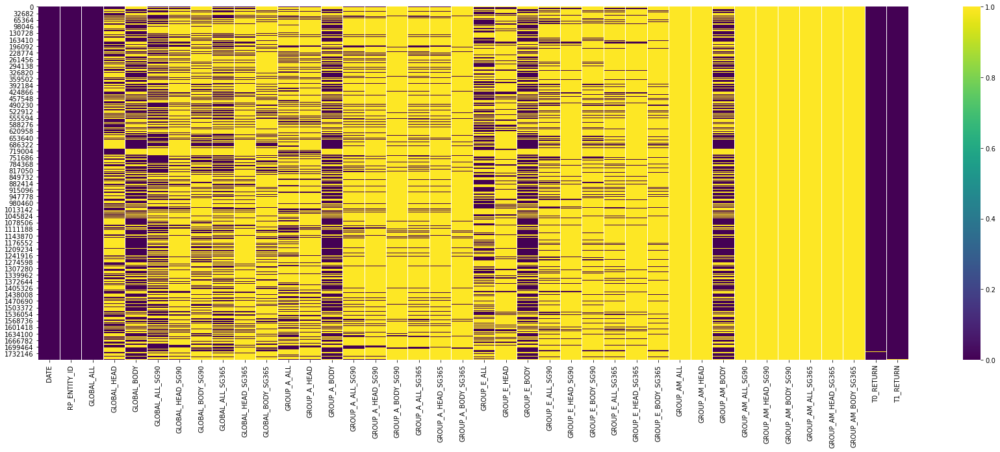

In [263]:
plt.figure(figsize=(30,10))
sns.heatmap(df.iloc[:,:].isna(),cmap='viridis');
## Missing value: no evident temporal structure
###Imputations with RF are good for strong non-linear relationships between continuous variables and when there are interactions

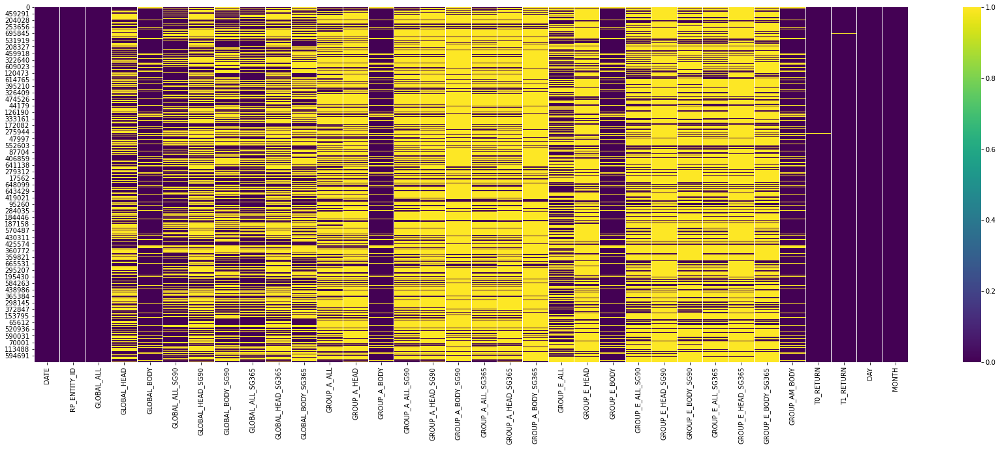

In [120]:
plt.figure(figsize=(30,10))
sns.heatmap(df.sort_values(by=['MONTH'], ascending=True).isna(),cmap='viridis');
#Missing values: no evident Saisonal structure

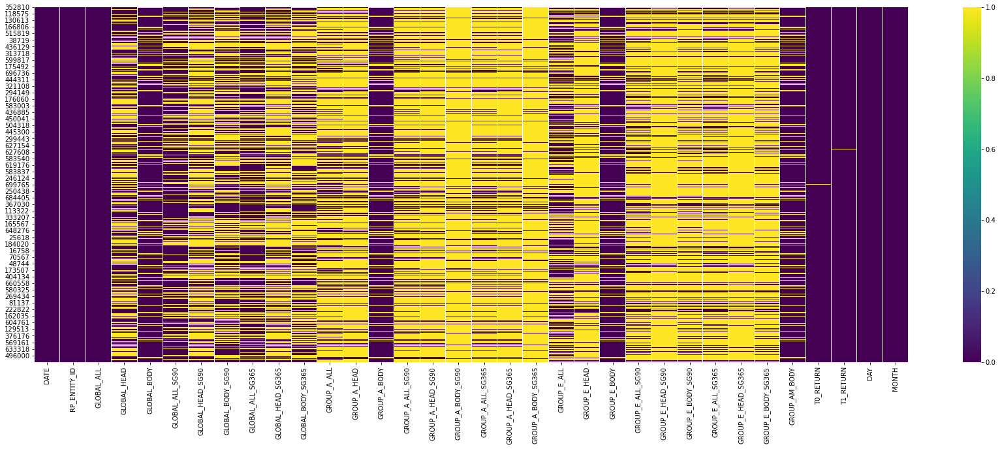

In [121]:
plt.figure(figsize=(30,10))
sns.heatmap(df.sort_values(by=['DAY'], ascending=True).isna(),cmap='viridis');
#Missing values: no evident Saisonal structure

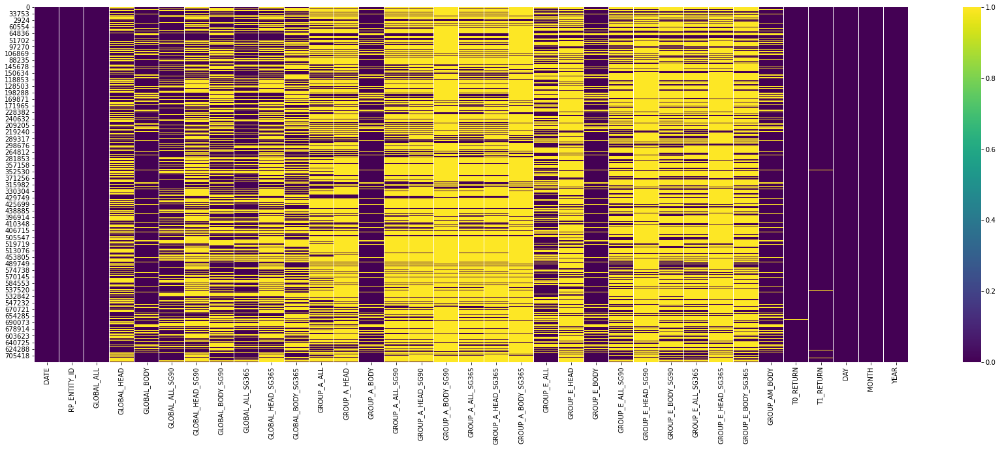

In [124]:
plt.figure(figsize=(30,10))
sns.heatmap(df.sort_values(by=['YEAR'], ascending=True).isna(),cmap='viridis');
#Missing values: no evident Saisonal structure

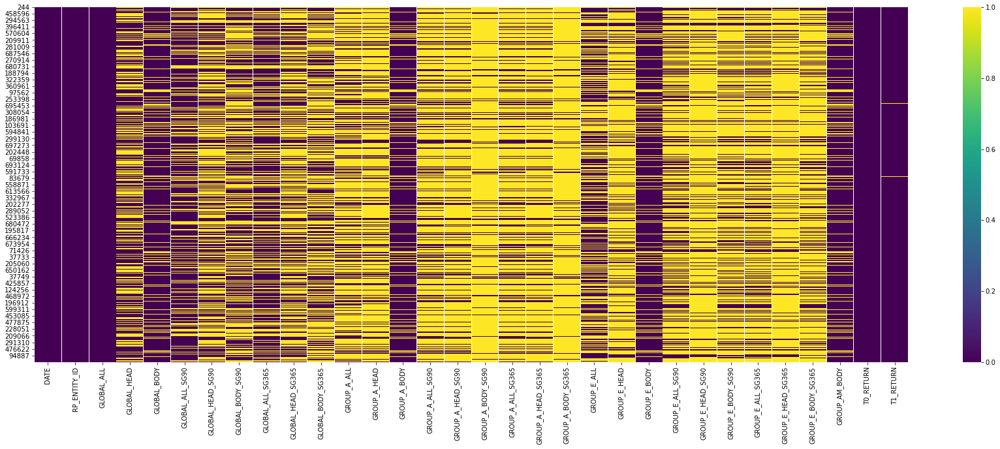

In [112]:
plt.figure(figsize=(30,10))
sns.heatmap(df.sort_values(by=['RP_ENTITY_ID','DATE'], ascending=True).isna(),cmap='viridis');
#Missing values: no evident assets structure

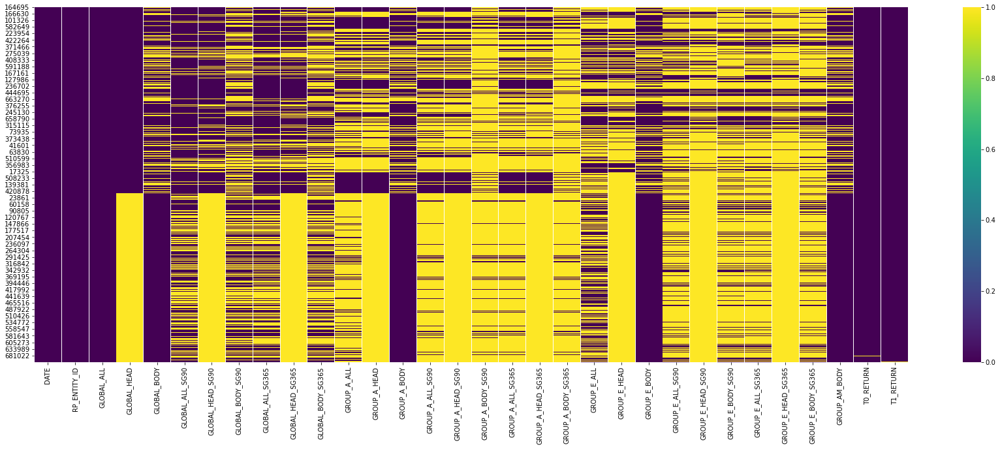

In [86]:
sorted_df = df.sort_values(by=['GLOBAL_HEAD'], ascending=True)

plt.figure(figsize=(30,10))
sns.heatmap(sorted_df.isna(),cmap='viridis');

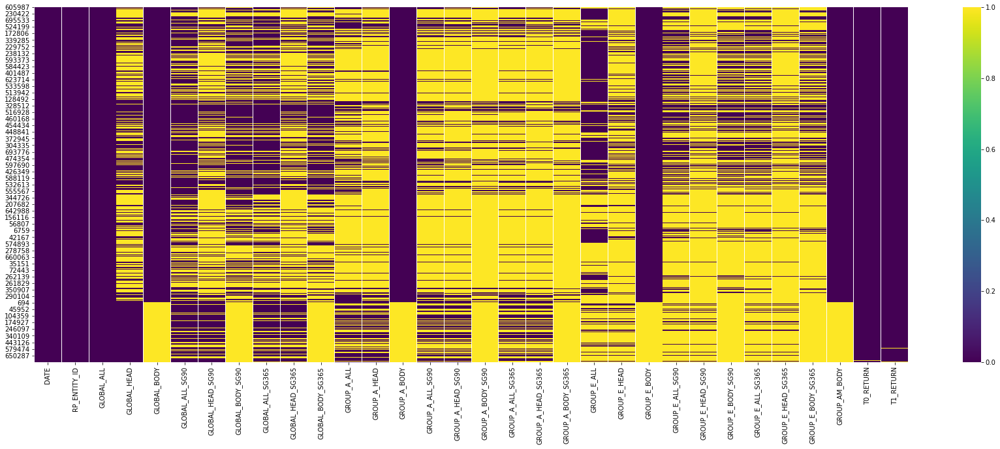

In [87]:
sorted_df = df.sort_values(by=['GLOBAL_BODY'], ascending=True)

plt.figure(figsize=(30,10))
sns.heatmap(sorted_df.isna(),cmap='viridis');

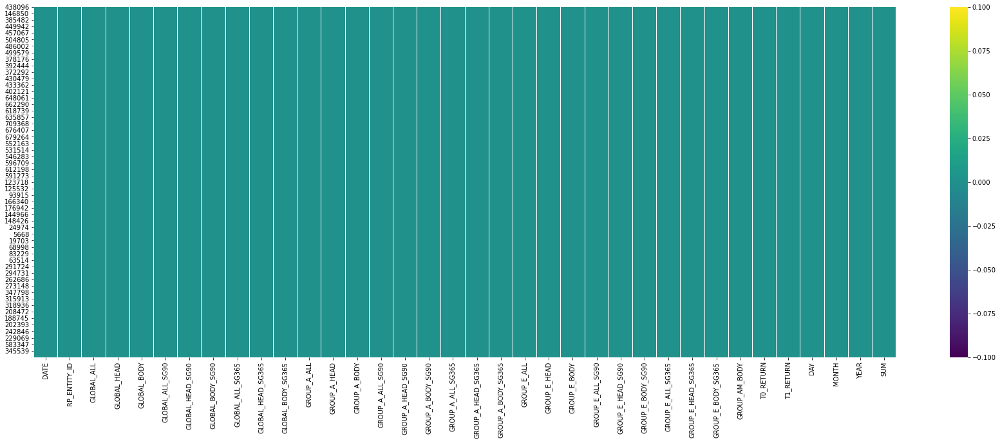

In [167]:
sorted_df = df.sort_values(by=['GROUP_A_BODY_SG365'], ascending=True)

plt.figure(figsize=(30,10))
sns.heatmap(sorted_df.isna(),cmap='viridis');

In [ ]:
y1 = pd.DataFrame(pd.DataFrame(dico_y['optim'])['y1'])
slots = pd.DataFrame(dico_y_slot['optim'])[1:-1]
data_pairplot = pd.merge(y1, slots, left_index=True, right_index=True)

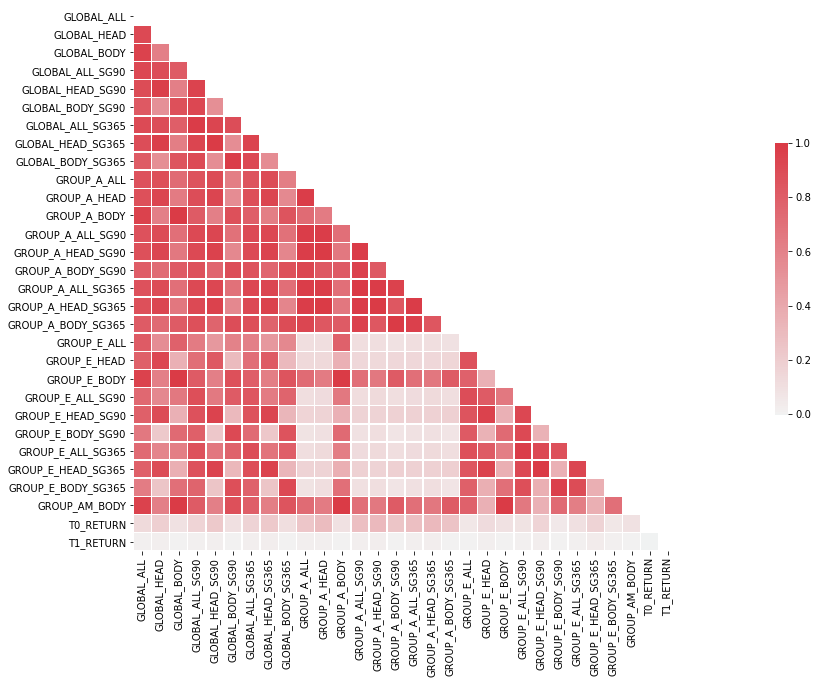

In [81]:
f, ax = plt.subplots(figsize=(35, 10))
corr = df.iloc[:,2:].corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap=sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [82]:
# corr = data_pairplot.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2).set_properties(**{'font-size': '12pt'})

,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,GLOBAL_BODY_SG365,GROUP_A_ALL,GROUP_A_HEAD,GROUP_A_BODY,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GROUP_A_BODY_SG90,GROUP_A_ALL_SG365,GROUP_A_HEAD_SG365,GROUP_A_BODY_SG365,GROUP_E_ALL,GROUP_E_HEAD,GROUP_E_BODY,GROUP_E_ALL_SG90,GROUP_E_HEAD_SG90,GROUP_E_BODY_SG90,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GROUP_E_BODY_SG365,GROUP_AM_BODY,T0_RETURN,T1_RETURN
GLOBAL_ALL,1.00,0.92,0.95,0.92,0.90,0.83,0.91,0.90,0.81,0.87,0.88,0.95,0.87,0.88,0.81,0.87,0.88,0.81,0.82,0.79,0.95,0.75,0.79,0.66,0.73,0.79,0.63,0.95,0.13,0.01
GLOBAL_HEAD,0.92,1.00,0.62,0.90,0.97,0.53,0.89,0.97,0.53,0.89,0.94,0.62,0.90,0.93,0.73,0.90,0.93,0.74,0.54,0.92,0.62,0.57,0.90,0.23,0.59,0.90,0.25,0.62,0.20,0.02
GLOBAL_BODY,0.95,0.62,1.00,0.82,0.62,0.88,0.80,0.63,0.86,0.73,0.64,1.00,0.70,0.66,0.81,0.71,0.67,0.82,0.78,0.36,1.00,0.66,0.36,0.74,0.63,0.36,0.70,1.00,0.09,0.01
GLOBAL_ALL_SG90,0.92,0.90,0.82,1.00,0.95,0.92,0.99,0.95,0.91,0.86,0.89,0.82,0.92,0.92,0.87,0.92,0.92,0.88,0.64,0.72,0.82,0.88,0.87,0.79,0.87,0.87,0.77,0.82,0.16,0.02
GLOBAL_HEAD_SG90,0.90,0.97,0.62,0.95,1.00,0.54,0.94,1.00,0.54,0.90,0.94,0.62,0.93,0.96,0.76,0.93,0.96,0.77,0.49,0.83,0.62,0.65,0.95,0.23,0.66,0.95,0.25,0.62,0.22,0.02
GLOBAL_BODY_SG90,0.83,0.53,0.88,0.92,0.54,1.00,0.89,0.54,0.98,0.62,0.55,0.88,0.70,0.57,0.89,0.70,0.58,0.89,0.61,0.30,0.88,0.81,0.31,0.91,0.77,0.32,0.89,0.88,0.10,0.01
GLOBAL_ALL_SG365,0.91,0.89,0.80,0.99,0.94,0.89,1.00,0.95,0.92,0.85,0.89,0.80,0.91,0.91,0.86,0.92,0.92,0.88,0.62,0.72,0.80,0.85,0.86,0.73,0.89,0.89,0.78,0.80,0.17,0.02
GLOBAL_HEAD_SG365,0.90,0.97,0.63,0.95,1.00,0.54,0.95,1.00,0.55,0.90,0.94,0.63,0.93,0.95,0.76,0.93,0.96,0.77,0.49,0.82,0.63,0.65,0.94,0.23,0.68,0.96,0.25,0.63,0.22,0.03
GLOBAL_BODY_SG365,0.81,0.53,0.86,0.91,0.54,0.98,0.92,0.55,1.00,0.63,0.56,0.86,0.70,0.58,0.88,0.71,0.59,0.90,0.57,0.31,0.86,0.77,0.33,0.86,0.80,0.33,0.92,0.86,0.10,0.01
GROUP_A_ALL,0.87,0.89,0.73,0.86,0.90,0.62,0.85,0.90,0.63,1.00,0.98,0.73,0.98,0.98,0.94,0.98,0.98,0.94,0.11,0.14,0.73,0.11,0.16,0.08,0.11,0.17,0.08,0.73,0.24,0.02


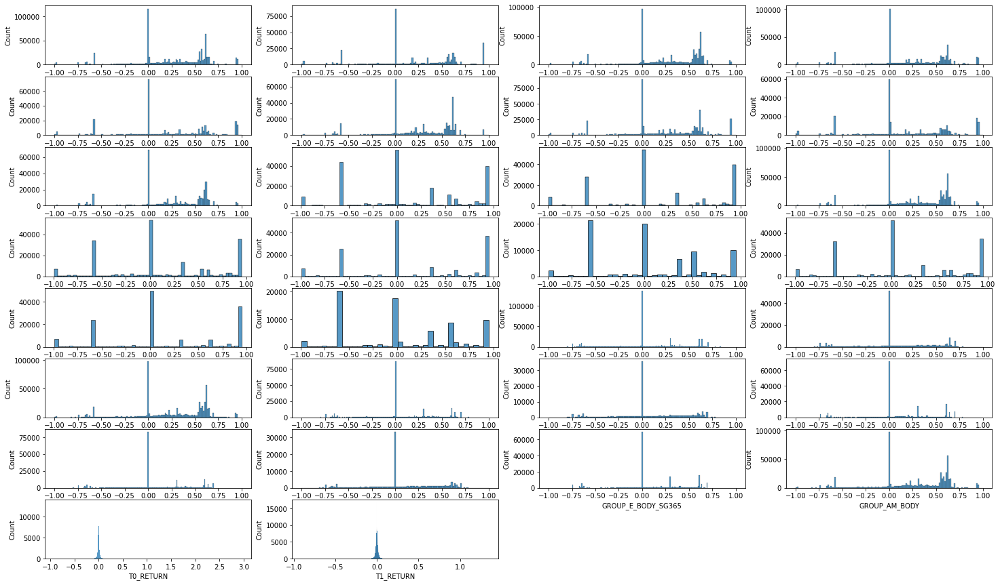

In [84]:
cols = df.columns[2:]

fig = plt.figure(figsize=(25, 15))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

for i,col in enumerate(cols):
    ax = fig.add_subplot(8, 4, i+1)
    sns.histplot(df[col], ax=ax)
plt.show()
    
    
    
    
#     sns.lineplot(x=range(len(y_slot_full)), y=y_slot_full, linewidth = 0.2, color=colorGraph[i], ax=ax2)
#     sns.histplot(y_slot_optim, binwidth=1, color=colorGraph[i], ax=ax3)
#     sns.lineplot(x=range(len(y_slot_optim)), y=y_slot_optim, linewidth = 0.2, color=colorGraph[i], ax=ax4)
# fig.suptitle('durée en jours', fontsize=20)


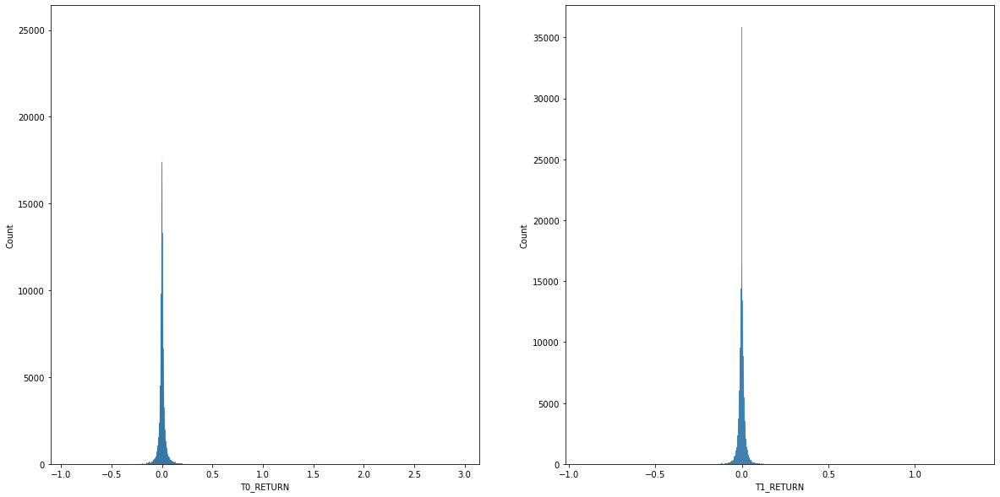

In [267]:
cols = ['T0_RETURN','T1_RETURN']

fig = plt.figure(figsize=(20, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

for i,col in enumerate(cols):
    ax = fig.add_subplot(1, 2, i+1)
    sns.histplot(df[col], ax=ax)
plt.show()

In [301]:
df['T1_RETURN'].max()
df['T0_RETURN'][df['T0_RETURN']<=1]

0          0.018520
1          0.018520
2         -0.001415
3         -0.005460
4         -0.005460
             ...   
1764819   -0.003989
1764820   -0.001759
1764821   -0.001759
1764822   -0.002900
1764823   -0.002900
Name: T0_RETURN, Length: 1761988, dtype: float64

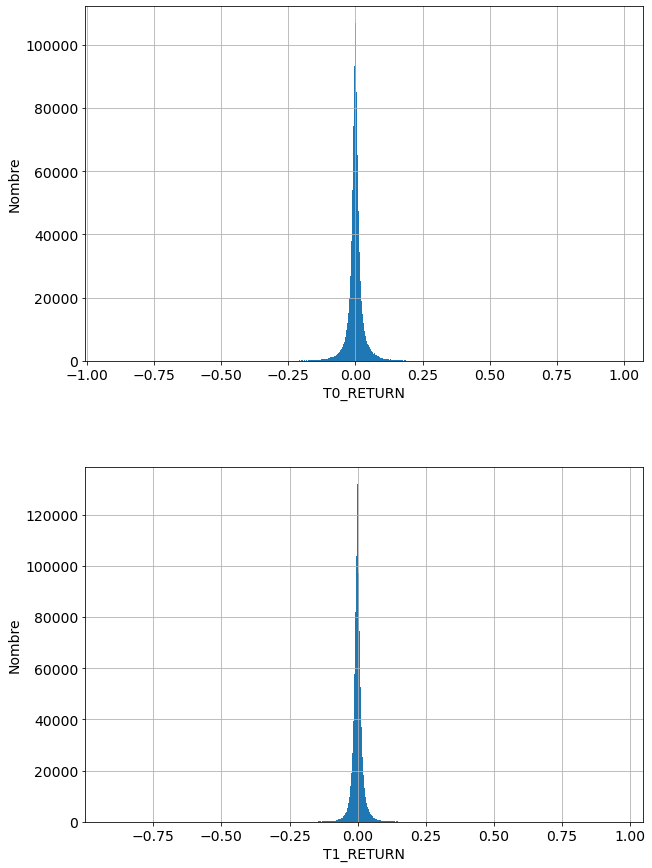

In [304]:
# fig = plt.figure(figsize=(100, 20))
# fig = plt.figure(figsize=(25, 15))
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(10, 15))
fig.subplots_adjust(hspace=0.3, wspace=0.3)
df['T0_RETURN'][df['T0_RETURN']<=1].hist(ax=ax1, bins=1000)
ax1.tick_params(labelsize=14)
ax1.set_xlabel('T0_RETURN', fontsize=14)
ax1.set_ylabel('Nombre', fontsize=14)
df['T1_RETURN'][df['T1_RETURN']<=1].hist(ax=ax2, bins=1000)
ax2.tick_params(labelsize=14)
ax2.set_xlabel('T1_RETURN', fontsize=14)
ax2.set_ylabel('Nombre', fontsize=14)
plt.show();

In [338]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df[['T0_RETURN','T1_RETURN']].describe([0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,0.99,0.995])

,T0_RETURN,T1_RETURN
count,711495.000,710458.000
mean,0.000,-0.000
std,0.028,0.023
min,-0.911,-0.906
0.5%,-0.103,-0.082
1%,-0.076,-0.060
5%,-0.032,-0.028
10%,-0.020,-0.018
15%,-0.015,-0.014
20%,-0.011,-0.010


In [339]:
df4=pd.DataFrame()
df4['T0_RETURN']=df['T0_RETURN'][df['T0_RETURN']<df['T0_RETURN'].quantile(0.999)]
df4['T1_RETURN']=df['T1_RETURN']#[df['T1_RETURN']<df['T1_RETURN'].quantile(0.999)]

df4[['T0_RETURN','T1_RETURN']].describe([0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,0.99,0.995])

,T0_RETURN,T1_RETURN
count,710783.000,708510.000
mean,-0.000,-0.000
std,0.026,0.023
min,-0.911,-0.906
0.5%,-0.104,-0.081
1%,-0.076,-0.060
5%,-0.032,-0.027
10%,-0.020,-0.018
15%,-0.015,-0.014
20%,-0.011,-0.010


In [328]:
df['T0_RETURN'][df['T0_RETURN']>df['T0_RETURN'].quantile(0.99)].describe()

count   17617.000
mean        0.180
std         0.097
min         0.113
25%         0.128
50%         0.149
75%         0.193
max         2.956
Name: T0_RETURN, dtype: float64

In [330]:
df['T1_RETURN'][df['T1_RETURN']>df['T1_RETURN'].quantile(0.995)].describe()

count   8795.000
mean       0.149
std        0.086
min        0.090
25%        0.103
50%        0.123
75%        0.163
max        1.345
Name: T1_RETURN, dtype: float64

In [ ]:
df[df['RP_ENTITY_ID']=='42ABA7'].loc[df['T0_RETURN']>=0.01,:]

In [395]:
ret = 0.02
ent = '42ABA7'
critere=df.columns[2:-2]
RETURN = 'T0_RETURN'

for crit in critere:
    hausse_mean = df[crit].loc[(df['RP_ENTITY_ID']==ent)&(df[RETURN]>=ret)].mean()
    hausse_std = df[crit].loc[(df['RP_ENTITY_ID']==ent)&(df[RETURN]>=ret)].std()
    baisse_mean = df[crit].loc[(df['RP_ENTITY_ID']=='42ABA7')&(df[RETURN]<=ret)].mean()
    baisse_std = df[crit].loc[(df['RP_ENTITY_ID']=='42ABA7')&(df[RETURN]<=ret)].std()
    print('=>entity:',ent, '=>criterion:', crit, '=>return:',RETURN, '=>trigger:',ret)
    print(hausse_mean,baisse_mean)
    print(hausse_std,baisse_std)
    print()

=>entity: 42ABA7 =>criterion: GLOBAL_ALL =>return: T0_RETURN =>trigger: 0.02
0.06071694374748549 0.03789834427037883
0.19208957433424656 0.1676974115922237

=>entity: 42ABA7 =>criterion: GLOBAL_HEAD =>return: T0_RETURN =>trigger: 0.02
0.029999215227425904 0.006119061942834314
0.13298268134732857 0.1121950993127638

=>entity: 42ABA7 =>criterion: GLOBAL_BODY =>return: T0_RETURN =>trigger: 0.02
0.10624450084051393 0.08732314205118466
0.29211907349902355 0.27666471121058706

=>entity: 42ABA7 =>criterion: GLOBAL_ALL_SG90 =>return: T0_RETURN =>trigger: 0.02
0.05502092074535052 0.03021487043126525
0.18555548877953815 0.14988918995902226

=>entity: 42ABA7 =>criterion: GLOBAL_HEAD_SG90 =>return: T0_RETURN =>trigger: 0.02
0.026388272331838568 0.004350284808193142
0.12305005680732484 0.10647394549497406

=>entity: 42ABA7 =>criterion: GLOBAL_BODY_SG90 =>return: T0_RETURN =>trigger: 0.02
0.14952479608578176 0.10699017988824659
0.357048922412161 0.3183888788512509

=>entity: 42ABA7 =>criterion: GLOB

In [371]:
ret = 0.04
hausse = df['GLOBAL_HEAD'].loc[(df['RP_ENTITY_ID']=='42ABA7')&(df['T0_RETURN']>=ret)].mean()
baisse = df['GLOBAL_HEAD'].loc[(df['RP_ENTITY_ID']=='42ABA7')&(df['T0_RETURN']<=ret)].mean()
print(hausse,baisse)

0.05036151832019782 0.0073920108313171515


Index(['GLOBAL_ALL', 'GLOBAL_HEAD', 'GLOBAL_BODY', 'GLOBAL_ALL_SG90',
       'GLOBAL_HEAD_SG90', 'GLOBAL_BODY_SG90', 'GLOBAL_ALL_SG365',
       'GLOBAL_HEAD_SG365', 'GLOBAL_BODY_SG365', 'GROUP_A_ALL', 'GROUP_A_HEAD',
       'GROUP_A_BODY', 'GROUP_A_ALL_SG90', 'GROUP_A_HEAD_SG90',
       'GROUP_A_BODY_SG90', 'GROUP_A_ALL_SG365', 'GROUP_A_HEAD_SG365',
       'GROUP_A_BODY_SG365', 'GROUP_E_ALL', 'GROUP_E_HEAD', 'GROUP_E_BODY',
       'GROUP_E_ALL_SG90', 'GROUP_E_HEAD_SG90', 'GROUP_E_BODY_SG90',
       'GROUP_E_ALL_SG365', 'GROUP_E_HEAD_SG365', 'GROUP_E_BODY_SG365',
       'GROUP_AM_ALL', 'GROUP_AM_HEAD', 'GROUP_AM_BODY', 'GROUP_AM_ALL_SG90',
       'GROUP_AM_HEAD_SG90', 'GROUP_AM_BODY_SG90', 'GROUP_AM_ALL_SG365',
       'GROUP_AM_HEAD_SG365', 'GROUP_AM_BODY_SG365'],
      dtype='object')

In [213]:
df.fillna(0, inplace=True)

In [214]:
df.describe()

,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,GLOBAL_BODY_SG365,GROUP_A_ALL,GROUP_A_HEAD,GROUP_A_BODY,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GROUP_A_BODY_SG90,GROUP_A_ALL_SG365,GROUP_A_HEAD_SG365,GROUP_A_BODY_SG365,GROUP_E_ALL,GROUP_E_HEAD,GROUP_E_BODY,GROUP_E_ALL_SG90,GROUP_E_HEAD_SG90,GROUP_E_BODY_SG90,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GROUP_E_BODY_SG365,GROUP_AM_BODY,T0_RETURN,T1_RETURN
count,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000,712758.000000
mean,0.244088,0.104871,0.213691,0.158057,0.074144,0.122060,0.138039,0.067708,0.103859,0.036205,0.037208,0.213691,0.034235,0.033194,0.005972,0.032176,0.031311,0.005522,0.055465,0.019818,0.213691,0.035918,0.015441,0.033182,0.031269,0.014290,0.028666,0.213691,0.000296,-0.000071
std,0.411034,0.357134,0.372704,0.377104,0.328672,0.307787,0.368005,0.321140,0.296388,0.338323,0.302746,0.372704,0.306224,0.288039,0.187327,0.300138,0.282219,0.182557,0.274036,0.181046,0.372704,0.219955,0.155569,0.201732,0.209310,0.151441,0.191614,0.372704,0.028176,0.022874
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.990000,-0.990000,-1.000000,-0.990000,-0.990000,-0.990000,-0.990000,-0.990000,-0.990000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.910788,-0.906011
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.008569,-0.008082
50%,0.305000,0.000000,0.180000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.180000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.180000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.180000,-0.000058,-0.000144
75%,0.587640,0.220000,0.570000,0.512807,0.000000,0.305000,0.414286,0.000000,0.218333,0.000000,0.000000,0.570000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.570000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.570000,0.008621,0.007580
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.950000,0.950000,1.000000,0.950000,0.950000,0.950000,0.950000,0.950000,0.950000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.955917,1.344644


In [368]:
list_asset = df.RP_ENTITY_ID.value_counts().loc[(df.RP_ENTITY_ID.value_counts()<2600)&(df.RP_ENTITY_ID.value_counts()>2200)].index
list_asset

Index(['A6213D', '6203E4', 'D6489C', 'E8846E', '4AC91D', '25102A', '12DE76',
       'A18D3C', '267718', '713810', '24CB56', '17EDA5', 'C83B88', '972356'],
      dtype='object')

In [369]:
beg = '2005-01-03'

fig = go.Figure()
for asset in list_asset:
    df2 = df.query("RP_ENTITY_ID==@asset")#['DATE'].loc['2005-01-03':, :]
    df2 = df2[df2['DATE']>=beg]
    df2['PRICE'] = 100*(1 + df2['T0_RETURN']).cumprod()
    df2['PRICE'] = df2['PRICE'].shift(1)
#     df2['PRICE'].iloc[0]=100
    df2 = df2.loc[:,['DATE','PRICE', 'RP_ENTITY_ID']]
    # fig = px.line(df, x="DATE", y="lifeExp", color='country')
    # fig.show()
#     print(df2)
#     dfp = df[df['country']==c].pivot(index='year', columns='country', values='pop') 
    fig.add_traces(go.Scatter(x=df2.DATE, y=df2.PRICE, mode='lines', name = asset))

fig.show()

In [260]:
beg = '2005-01-03'

fig = go.Figure()
for asset in list_asset:
    df2 = df.query("RP_ENTITY_ID==@asset")#['DATE'].loc['2005-01-03':, :]
    df2 = df2[df2['DATE']>=beg]
    df2['PRICE'] = 100*(1 + df2['T0_RETURN']).cumprod()
    df2['PRICE'] = df2['PRICE'].shift(1)
#     df2['PRICE'].iloc[0]=100
    df2 = df2.loc[:,['DATE','PRICE', 'RP_ENTITY_ID']]
    # fig = px.line(df, x="DATE", y="lifeExp", color='country')
    # fig.show()
#     print(df2)
#     dfp = df[df['country']==c].pivot(index='year', columns='country', values='pop') 
    fig.add_traces(go.Scatter(x=df2.DATE, y=df2.PRICE, mode='lines', name = asset))

fig.show()

In [231]:
fig = px.line(df2, x="DATE", y="PRICE", color='RP_ENTITY_ID')
fig.show()

In [241]:
df2.PRICE

Series([], Name: PRICE, dtype: float64)

In [258]:
df.RP_ENTITY_ID.value_counts()

619882    3093
50070E    3092
9196A2    3083
990AD0    3027
CFF97C    3003
          ... 
9F2C11       1
CB6A9C       1
B09F19       1
DDC25F       1
AA1F21       1
Name: RP_ENTITY_ID, Length: 1768, dtype: int64

In [396]:
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
# from IPython.display import display
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import VotingClassifier

In [381]:
non_target_cols

['GLOBAL_BODY_SG365',
 'GROUP_E_ALL_SG365',
 'GROUP_E_HEAD_SG365',
 'GLOBAL_HEAD',
 'GROUP_AM_BODY',
 'GROUP_A_BODY',
 'GROUP_A_BODY_SG365',
 'GROUP_E_BODY_SG90',
 'GROUP_A_HEAD_SG365',
 'GLOBAL_HEAD_SG90',
 'GROUP_A_ALL',
 'GROUP_A_HEAD',
 'GROUP_E_ALL_SG90',
 'GROUP_A_ALL_SG365',
 'GLOBAL_ALL_SG365',
 'GLOBAL_ALL',
 'GLOBAL_ALL_SG90',
 'T0_RETURN',
 'GROUP_E_HEAD',
 'GROUP_A_BODY_SG90',
 'GROUP_A_ALL_SG90',
 'GROUP_A_HEAD_SG90',
 'GLOBAL_HEAD_SG365',
 'GROUP_E_ALL',
 'GLOBAL_BODY_SG90',
 'GROUP_E_BODY_SG365',
 'GROUP_E_HEAD_SG90',
 'GROUP_E_BODY',
 'GLOBAL_BODY']

In [263]:
X

,GLOBAL_BODY_SG365,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GLOBAL_HEAD,GROUP_AM_BODY,GROUP_A_BODY,GROUP_A_BODY_SG365,GROUP_E_BODY_SG90,GROUP_A_HEAD_SG365,GLOBAL_HEAD_SG90,GROUP_A_ALL,GROUP_A_HEAD,GROUP_E_ALL_SG90,GROUP_A_ALL_SG365,GLOBAL_ALL_SG365,GLOBAL_ALL,GLOBAL_ALL_SG90,T0_RETURN,GROUP_E_HEAD,GROUP_A_BODY_SG90,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GLOBAL_HEAD_SG365,GROUP_E_ALL,GLOBAL_BODY_SG90,GROUP_E_BODY_SG365,GROUP_E_HEAD_SG90,GROUP_E_BODY,GLOBAL_BODY
0,0.61,0.61,0.0,0.000000,0.610000,0.610000,0.0,0.61,0.00,0.00,0.00,0.00,0.61,0.00,0.61,0.610000,0.61,0.018520,0.0,0.0,0.00,0.00,0.00,0.61,0.61,0.61,0.0,0.610000,0.610000
1,0.00,0.00,0.0,0.010000,0.000000,0.000000,0.0,0.00,0.01,0.01,0.01,0.01,0.00,0.01,0.01,0.010000,0.01,-0.001415,0.0,0.0,0.01,0.01,0.01,0.00,0.00,0.00,0.0,0.000000,0.000000
2,0.00,0.70,0.7,0.633333,0.000000,0.000000,0.0,0.00,0.00,0.66,0.00,0.00,0.70,0.00,0.70,0.633333,0.66,-0.005460,0.7,0.0,0.00,0.00,0.70,0.70,0.00,0.00,0.7,0.000000,0.000000
3,0.55,0.00,0.0,0.000000,0.550000,0.550000,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.55,0.550000,0.55,0.018809,0.0,0.0,0.00,0.00,0.00,0.00,0.55,0.00,0.0,0.550000,0.550000
4,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,-0.002185,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712753,0.22,0.00,0.0,0.000000,0.220000,0.220000,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.22,0.220000,0.22,0.036429,0.0,0.0,0.00,0.00,0.00,0.00,0.22,0.00,0.0,0.220000,0.220000
712754,0.70,0.70,0.0,0.000000,0.635000,0.635000,0.0,0.70,0.00,0.00,0.00,0.00,0.70,0.00,0.70,0.635000,0.70,0.023102,0.0,0.0,0.00,0.00,0.00,0.70,0.70,0.70,0.0,0.635000,0.635000
712755,0.00,0.00,0.0,0.220000,0.000000,0.000000,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.220000,0.00,-0.003989,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.000000,0.000000
712756,0.00,0.00,0.0,0.000000,-0.386667,-0.386667,0.0,0.00,0.00,0.00,-0.58,0.00,0.00,0.00,0.00,-0.386667,0.00,-0.001759,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,-0.386667,-0.386667


In [370]:
list_asset = df.RP_ENTITY_ID.value_counts().loc[(df.RP_ENTITY_ID.value_counts()<2600)&(df.RP_ENTITY_ID.value_counts()>2200)].index

TypeError: unsupported operand type(s) for +: 'set' and 'set'

In [401]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score

target_cols = ['T1_RETURN']
non_target_cols = list(set(df.columns) - set(['RP_ENTITY_ID'] + ['DATE']))#list(set(df.columns) - set(target_cols + ['RP_ENTITY_ID'] + ['DATE']))
non_target_cols

dg= df.sort_values(['DATE','RP_ENTITY_ID'], ignore_index = True).loc[df['RP_ENTITY_ID'].isin(list_asset), :]
X = dg.loc[:,non_target_cols]
y = dg.loc[:,target_cols]
tscv = TimeSeriesSplit()
print(tscv)

count=0
for train_index, test_index in tscv.split(X):
    start_time = time.time()
#     print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
#     for mf in np.linspace(100, 150, 6):
#         for ne in np.linspace(50, 100, 6):
#             for md in np.linspace(20, 40, 5):
#                 for msl in np.linspace(30, 100, 8):
#                     print(i,
#                                   mf, 
#                                   ne,
#                                   md, 
#                                   msl, )
#                     rfr = RandomForestRegressor(
#                         max_features=int(mf),
#                         n_estimators=int(ne),
#                         max_depth=int(md),
#                         min_samples_leaf=int(msl))
#                     rfr.fit(X_train, y_train)
#                     score.append([i,
#                                   mf, 
#                                   ne,
#                                   md, 
#                                   msl, 
#                                   rfr.score(X_test, y_test)])

    rfr = RandomForestRegressor(n_estimators=100)
    rfr.fit(X_train, y_train.values.ravel())
    print(rfr.score(X_test, y_test.values.ravel()))
    elapsed_time = time.time() - start_time
    count+=1
    print(f"Elapsed time to compute the tab_values{count:.0f}: {elapsed_time:.3f} seconds")


TimeSeriesSplit(max_train_size=None, n_splits=5)
0.9505696483781951
Elapsed time to compute the tab_values1: 3.900 seconds
0.9999827932023081
Elapsed time to compute the tab_values2: 11.265 seconds
0.9999736679197753
Elapsed time to compute the tab_values3: 21.615 seconds
0.999995159227132
Elapsed time to compute the tab_values4: 33.721 seconds
0.9999887270604849
Elapsed time to compute the tab_values5: 43.511 seconds


In [380]:
set(X.columns)

{'GLOBAL_ALL',
 'GLOBAL_ALL_SG365',
 'GLOBAL_ALL_SG90',
 'GLOBAL_BODY',
 'GLOBAL_BODY_SG365',
 'GLOBAL_BODY_SG90',
 'GLOBAL_HEAD',
 'GLOBAL_HEAD_SG365',
 'GLOBAL_HEAD_SG90',
 'GROUP_AM_BODY',
 'GROUP_A_ALL',
 'GROUP_A_ALL_SG365',
 'GROUP_A_ALL_SG90',
 'GROUP_A_BODY',
 'GROUP_A_BODY_SG365',
 'GROUP_A_BODY_SG90',
 'GROUP_A_HEAD',
 'GROUP_A_HEAD_SG365',
 'GROUP_A_HEAD_SG90',
 'GROUP_E_ALL',
 'GROUP_E_ALL_SG365',
 'GROUP_E_ALL_SG90',
 'GROUP_E_BODY',
 'GROUP_E_BODY_SG365',
 'GROUP_E_BODY_SG90',
 'GROUP_E_HEAD',
 'GROUP_E_HEAD_SG365',
 'GROUP_E_HEAD_SG90',
 'T0_RETURN'}

In [286]:
# rf = RandomForestRegressor(bootstrap=True,
#             max_depth=None, max_features=0.3, max_leaf_nodes=None,
#             min_impurity_decrease=0.0, min_impurity_split=None,
#             min_samples_leaf=1, min_samples_split=2,
#             min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=4,
#             oob_score=False, random_state=None, verbose=1,
#             warm_start=False)

In [238]:
df

,DATE,RP_ENTITY_ID,GLOBAL_ALL,GLOBAL_HEAD,GLOBAL_BODY,GLOBAL_ALL_SG90,GLOBAL_HEAD_SG90,GLOBAL_BODY_SG90,GLOBAL_ALL_SG365,GLOBAL_HEAD_SG365,GLOBAL_BODY_SG365,GROUP_A_ALL,GROUP_A_HEAD,GROUP_A_BODY,GROUP_A_ALL_SG90,GROUP_A_HEAD_SG90,GROUP_A_BODY_SG90,GROUP_A_ALL_SG365,GROUP_A_HEAD_SG365,GROUP_A_BODY_SG365,GROUP_E_ALL,GROUP_E_HEAD,GROUP_E_BODY,GROUP_E_ALL_SG90,GROUP_E_HEAD_SG90,GROUP_E_BODY_SG90,GROUP_E_ALL_SG365,GROUP_E_HEAD_SG365,GROUP_E_BODY_SG365,GROUP_AM_BODY,T0_RETURN,T1_RETURN
0,2005-01-03,0157B1,0.610000,0.000000,0.610000,0.61,0.00,0.61,0.61,0.00,0.61,0.00,0.00,0.610000,0.00,0.00,0.0,0.00,0.00,0.0,0.61,0.0,0.610000,0.61,0.0,0.61,0.61,0.0,0.61,0.610000,0.018520,-0.037526
1,2005-01-03,046263,0.010000,0.010000,0.000000,0.01,0.01,0.00,0.01,0.01,0.00,0.01,0.01,0.000000,0.01,0.01,0.0,0.01,0.01,0.0,0.00,0.0,0.000000,0.00,0.0,0.00,0.00,0.0,0.00,0.000000,-0.001415,0.007740
2,2005-01-03,07CA6A,0.633333,0.633333,0.000000,0.66,0.66,0.00,0.70,0.70,0.00,0.00,0.00,0.000000,0.00,0.00,0.0,0.00,0.00,0.0,0.70,0.7,0.000000,0.70,0.7,0.00,0.70,0.7,0.00,0.000000,-0.005460,0.008110
3,2005-01-03,0BC29E,0.550000,0.000000,0.550000,0.55,0.00,0.55,0.55,0.00,0.55,0.00,0.00,0.550000,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.550000,0.00,0.0,0.00,0.00,0.0,0.00,0.550000,0.018809,0.019265
4,2005-01-03,0BC6D8,0.000000,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.000000,0.00,0.0,0.00,0.00,0.0,0.00,0.000000,-0.002185,0.008238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
712753,2017-02-17,FD5C77,0.220000,0.000000,0.220000,0.22,0.00,0.22,0.22,0.00,0.22,0.00,0.00,0.220000,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.220000,0.00,0.0,0.00,0.00,0.0,0.00,0.220000,0.036429,0.000000
712754,2017-02-17,FDF28E,0.635000,0.000000,0.635000,0.70,0.00,0.70,0.70,0.00,0.70,0.00,0.00,0.635000,0.00,0.00,0.0,0.00,0.00,0.0,0.70,0.0,0.635000,0.70,0.0,0.70,0.70,0.0,0.70,0.635000,0.023102,0.000000
712755,2017-02-17,FEC475,0.220000,0.220000,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,0.000000,0.00,0.0,0.00,0.00,0.0,0.00,0.000000,-0.003989,0.000000
712756,2017-02-17,FF4BA4,-0.386667,0.000000,-0.386667,0.00,0.00,0.00,0.00,0.00,0.00,-0.58,0.00,-0.386667,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.0,-0.386667,0.00,0.0,0.00,0.00,0.0,0.00,-0.386667,-0.001759,0.000000


In [ ]:
feature_imp = pd.Series(rf.feature_importances_,index=X_test.columns).sort_values(ascending=False)
feature_imp.head(60)

In [397]:
from sklearn.feature_selection import RFE

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from datetime import timedelta
import calender


### Check if the data is stationary

In [32]:
from statsmodels.tsa.stattools import adfuller
from numpy import log



list_asset = df.RP_ENTITY_ID.value_counts().loc[df.RP_ENTITY_ID.value_counts()>10000].index
list_asset


dg = df.loc[df['RP_ENTITY_ID'].isin(list_asset),'T0_RETURN'].dropna()
result = adfuller(dg)
print('p-value: %f' % result[1])

p-value: 0.000000


Since the p-value is below 0.05, the data can be assumed to be stationary hence we can proceed with the data without any transformation.

### Create lag variables

In [202]:
!jupyter notebook --NotebookApp.iopub_data_rate_limit=1e10

^C


In [181]:
df.RP_ENTITY_ID.value_counts().loc[df.RP_ENTITY_ID.value_counts()>=2500].index

Index(['619882', '50070E', '9196A2', '990AD0', 'CFF97C', 'B3CB74', '228D42',
       '4A6F00', '1921DD', '8D4486', '3461CF', 'D91D4E', 'D8442A', '8A8E41',
       'A6213D'],
      dtype='object')

In [230]:
import time
lag=10
cols=df.columns[2:-2]
list_asset = df.RP_ENTITY_ID.value_counts().loc[df.RP_ENTITY_ID.value_counts()>=lag+1500].index

start_time = time.time()



    
    
count=0    
final_data = []
for asset in list_asset:
    df_temp = df.loc[df['RP_ENTITY_ID']==asset, :]
    dataframe_to_append = pd.DataFrame()
    for col in cols:
        for i in range(lag,0,-1):
            dataframe_to_append[str(col)+'_t-' + str(i)] = df_temp.loc[:, str(col)].shift(i)
    final_data.append(dataframe_to_append)
    elapsed_time = time.time() - start_time
    count+=1
    print(f"Elapsed time to compute the tab_values{count:.0f}: {elapsed_time:.3f} seconds")

# final_data

Elapsed time to compute the tab_values1: 0.538 seconds
Elapsed time to compute the tab_values2: 1.136 seconds
Elapsed time to compute the tab_values3: 1.470 seconds
Elapsed time to compute the tab_values4: 1.870 seconds
Elapsed time to compute the tab_values5: 2.200 seconds
Elapsed time to compute the tab_values6: 2.564 seconds
Elapsed time to compute the tab_values7: 2.974 seconds
Elapsed time to compute the tab_values8: 3.340 seconds
Elapsed time to compute the tab_values9: 3.734 seconds
Elapsed time to compute the tab_values10: 4.003 seconds
Elapsed time to compute the tab_values11: 4.420 seconds
Elapsed time to compute the tab_values12: 4.805 seconds
Elapsed time to compute the tab_values13: 5.121 seconds
Elapsed time to compute the tab_values14: 5.538 seconds
Elapsed time to compute the tab_values15: 5.853 seconds
Elapsed time to compute the tab_values16: 6.176 seconds
Elapsed time to compute the tab_values17: 6.604 seconds
Elapsed time to compute the tab_values18: 7.069 seconds
E

In [ ]:
final_data = pd.concat(final_data)

In [233]:
final_tab = final_data.dropna()
final_tab

,GLOBAL_ALL_t-10,GLOBAL_ALL_t-9,GLOBAL_ALL_t-8,GLOBAL_ALL_t-7,GLOBAL_ALL_t-6,GLOBAL_ALL_t-5,GLOBAL_ALL_t-4,GLOBAL_ALL_t-3,GLOBAL_ALL_t-2,GLOBAL_ALL_t-1,GLOBAL_HEAD_t-10,GLOBAL_HEAD_t-9,GLOBAL_HEAD_t-8,GLOBAL_HEAD_t-7,GLOBAL_HEAD_t-6,GLOBAL_HEAD_t-5,GLOBAL_HEAD_t-4,GLOBAL_HEAD_t-3,GLOBAL_HEAD_t-2,GLOBAL_HEAD_t-1,GLOBAL_BODY_t-10,GLOBAL_BODY_t-9,GLOBAL_BODY_t-8,GLOBAL_BODY_t-7,GLOBAL_BODY_t-6,GLOBAL_BODY_t-5,GLOBAL_BODY_t-4,GLOBAL_BODY_t-3,GLOBAL_BODY_t-2,GLOBAL_BODY_t-1,GLOBAL_ALL_SG90_t-10,GLOBAL_ALL_SG90_t-9,GLOBAL_ALL_SG90_t-8,GLOBAL_ALL_SG90_t-7,GLOBAL_ALL_SG90_t-6,GLOBAL_ALL_SG90_t-5,GLOBAL_ALL_SG90_t-4,GLOBAL_ALL_SG90_t-3,GLOBAL_ALL_SG90_t-2,GLOBAL_ALL_SG90_t-1,GLOBAL_HEAD_SG90_t-10,GLOBAL_HEAD_SG90_t-9,GLOBAL_HEAD_SG90_t-8,GLOBAL_HEAD_SG90_t-7,GLOBAL_HEAD_SG90_t-6,GLOBAL_HEAD_SG90_t-5,GLOBAL_HEAD_SG90_t-4,GLOBAL_HEAD_SG90_t-3,GLOBAL_HEAD_SG90_t-2,GLOBAL_HEAD_SG90_t-1,GLOBAL_BODY_SG90_t-10,GLOBAL_BODY_SG90_t-9,GLOBAL_BODY_SG90_t-8,GLOBAL_BODY_SG90_t-7,GLOBAL_BODY_SG90_t-6,GLOBAL_BODY_SG90_t-5,GLOBAL_BODY_SG90_t-4,GLOBAL_BODY_SG90_t-3,GLOBAL_BODY_SG90_t-2,GLOBAL_BODY_SG90_t-1,GLOBAL_ALL_SG365_t-10,GLOBAL_ALL_SG365_t-9,GLOBAL_ALL_SG365_t-8,GLOBAL_ALL_SG365_t-7,GLOBAL_ALL_SG365_t-6,GLOBAL_ALL_SG365_t-5,GLOBAL_ALL_SG365_t-4,GLOBAL_ALL_SG365_t-3,GLOBAL_ALL_SG365_t-2,GLOBAL_ALL_SG365_t-1,GLOBAL_HEAD_SG365_t-10,GLOBAL_HEAD_SG365_t-9,GLOBAL_HEAD_SG365_t-8,GLOBAL_HEAD_SG365_t-7,GLOBAL_HEAD_SG365_t-6,GLOBAL_HEAD_SG365_t-5,GLOBAL_HEAD_SG365_t-4,GLOBAL_HEAD_SG365_t-3,GLOBAL_HEAD_SG365_t-2,GLOBAL_HEAD_SG365_t-1,GLOBAL_BODY_SG365_t-10,GLOBAL_BODY_SG365_t-9,GLOBAL_BODY_SG365_t-8,GLOBAL_BODY_SG365_t-7,GLOBAL_BODY_SG365_t-6,GLOBAL_BODY_SG365_t-5,GLOBAL_BODY_SG365_t-4,GLOBAL_BODY_SG365_t-3,GLOBAL_BODY_SG365_t-2,GLOBAL_BODY_SG365_t-1,GROUP_A_ALL_t-10,GROUP_A_ALL_t-9,GROUP_A_ALL_t-8,GROUP_A_ALL_t-7,GROUP_A_ALL_t-6,GROUP_A_ALL_t-5,GROUP_A_ALL_t-4,GROUP_A_ALL_t-3,GROUP_A_ALL_t-2,GROUP_A_ALL_t-1,GROUP_A_HEAD_t-10,GROUP_A_HEAD_t-9,GROUP_A_HEAD_t-8,GROUP_A_HEAD_t-7,GROUP_A_HEAD_t-6,GROUP_A_HEAD_t-5,GROUP_A_HEAD_t-4,GROUP_A_HEAD_t-3,GROUP_A_HEAD_t-2,GROUP_A_HEAD_t-1,GROUP_A_BODY_t-10,GROUP_A_BODY_t-9,GROUP_A_BODY_t-8,GROUP_A_BODY_t-7,GROUP_A_BODY_t-6,GROUP_A_BODY_t-5,GROUP_A_BODY_t-4,GROUP_A_BODY_t-3,GROUP_A_BODY_t-2,GROUP_A_BODY_t-1,GROUP_A_ALL_SG90_t-10,GROUP_A_ALL_SG90_t-9,GROUP_A_ALL_SG90_t-8,GROUP_A_ALL_SG90_t-7,GROUP_A_ALL_SG90_t-6,GROUP_A_ALL_SG90_t-5,GROUP_A_ALL_SG90_t-4,GROUP_A_ALL_SG90_t-3,GROUP_A_ALL_SG90_t-2,GROUP_A_ALL_SG90_t-1,GROUP_A_HEAD_SG90_t-10,GROUP_A_HEAD_SG90_t-9,GROUP_A_HEAD_SG90_t-8,GROUP_A_HEAD_SG90_t-7,GROUP_A_HEAD_SG90_t-6,GROUP_A_HEAD_SG90_t-5,GROUP_A_HEAD_SG90_t-4,GROUP_A_HEAD_SG90_t-3,GROUP_A_HEAD_SG90_t-2,GROUP_A_HEAD_SG90_t-1,GROUP_A_BODY_SG90_t-10,GROUP_A_BODY_SG90_t-9,GROUP_A_BODY_SG90_t-8,GROUP_A_BODY_SG90_t-7,GROUP_A_BODY_SG90_t-6,GROUP_A_BODY_SG90_t-5,GROUP_A_BODY_SG90_t-4,GROUP_A_BODY_SG90_t-3,GROUP_A_BODY_SG90_t-2,GROUP_A_BODY_SG90_t-1,GROUP_A_ALL_SG365_t-10,GROUP_A_ALL_SG365_t-9,GROUP_A_ALL_SG365_t-8,GROUP_A_ALL_SG365_t-7,GROUP_A_ALL_SG365_t-6,GROUP_A_ALL_SG365_t-5,GROUP_A_ALL_SG365_t-4,GROUP_A_ALL_SG365_t-3,GROUP_A_ALL_SG365_t-2,GROUP_A_ALL_SG365_t-1,GROUP_A_HEAD_SG365_t-10,GROUP_A_HEAD_SG365_t-9,GROUP_A_HEAD_SG365_t-8,GROUP_A_HEAD_SG365_t-7,GROUP_A_HEAD_SG365_t-6,GROUP_A_HEAD_SG365_t-5,GROUP_A_HEAD_SG365_t-4,GROUP_A_HEAD_SG365_t-3,GROUP_A_HEAD_SG365_t-2,GROUP_A_HEAD_SG365_t-1,GROUP_A_BODY_SG365_t-10,GROUP_A_BODY_SG365_t-9,GROUP_A_BODY_SG365_t-8,GROUP_A_BODY_SG365_t-7,GROUP_A_BODY_SG365_t-6,GROUP_A_BODY_SG365_t-5,GROUP_A_BODY_SG365_t-4,GROUP_A_BODY_SG365_t-3,GROUP_A_BODY_SG365_t-2,GROUP_A_BODY_SG365_t-1,GROUP_E_ALL_t-10,GROUP_E_ALL_t-9,GROUP_E_ALL_t-8,GROUP_E_ALL_t-7,GROUP_E_ALL_t-6,GROUP_E_ALL_t-5,GROUP_E_ALL_t-4,GROUP_E_ALL_t-3,GROUP_E_ALL_t-2,GROUP_E_ALL_t-1,GROUP_E_HEAD_t-10,GROUP_E_HEAD_t-9,GROUP_E_HEAD_t-8,GROUP_E_HEAD_t-7,GROUP_E_HEAD_t-6,GROUP_E_HEAD_t-5,GROUP_E_HEAD_t-4,GROUP_E_HEAD_t-3,GROUP_E_HEAD_t-2,GROUP_E_HEAD_t-1,GROUP_E_BODY_t-10,GROUP_E_BODY_t-9,GROUP_E_BODY_t-8,GROUP_E_BODY_t-7,GROUP_E_BO

In [184]:
len(final_data.loc[final_data['GLOBAL_ALL_t-10'].isna(),:])

150

In [199]:
final_tab.join(df)

,GLOBAL_ALL_t-10,GLOBAL_ALL_t-9,GLOBAL_ALL_t-8,GLOBAL_ALL_t-7,GLOBAL_ALL_t-6,GLOBAL_ALL_t-5,GLOBAL_ALL_t-4,GLOBAL_ALL_t-3,GLOBAL_ALL_t-2,GLOBAL_ALL_t-1,GLOBAL_HEAD_t-10,GLOBAL_HEAD_t-9,GLOBAL_HEAD_t-8,GLOBAL_HEAD_t-7,GLOBAL_HEAD_t-6,GLOBAL_HEAD_t-5,GLOBAL_HEAD_t-4,GLOBAL_HEAD_t-3,GLOBAL_HEAD_t-2,GLOBAL_HEAD_t-1,GLOBAL_BODY_t-10,GLOBAL_BODY_t-9,GLOBAL_BODY_t-8,GLOBAL_BODY_t-7,GLOBAL_BODY_t-6,GLOBAL_BODY_t-5,GLOBAL_BODY_t-4,GLOBAL_BODY_t-3,GLOBAL_BODY_t-2,GLOBAL_BODY_t-1,GLOBAL_ALL_SG90_t-10,GLOBAL_ALL_SG90_t-9,GLOBAL_ALL_SG90_t-8,GLOBAL_ALL_SG90_t-7,GLOBAL_ALL_SG90_t-6,GLOBAL_ALL_SG90_t-5,GLOBAL_ALL_SG90_t-4,GLOBAL_ALL_SG90_t-3,GLOBAL_ALL_SG90_t-2,GLOBAL_ALL_SG90_t-1,GLOBAL_HEAD_SG90_t-10,GLOBAL_HEAD_SG90_t-9,GLOBAL_HEAD_SG90_t-8,GLOBAL_HEAD_SG90_t-7,GLOBAL_HEAD_SG90_t-6,GLOBAL_HEAD_SG90_t-5,GLOBAL_HEAD_SG90_t-4,GLOBAL_HEAD_SG90_t-3,GLOBAL_HEAD_SG90_t-2,GLOBAL_HEAD_SG90_t-1,GLOBAL_BODY_SG90_t-10,GLOBAL_BODY_SG90_t-9,GLOBAL_BODY_SG90_t-8,GLOBAL_BODY_SG90_t-7,GLOBAL_BODY_SG90_t-6,GLOBAL_BODY_SG90_t-5,GLOBAL_BODY_SG90_t-4,GLOBAL_BODY_SG90_t-3,GLOBAL_BODY_SG90_t-2,GLOBAL_BODY_SG90_t-1,GLOBAL_ALL_SG365_t-10,GLOBAL_ALL_SG365_t-9,GLOBAL_ALL_SG365_t-8,GLOBAL_ALL_SG365_t-7,GLOBAL_ALL_SG365_t-6,GLOBAL_ALL_SG365_t-5,GLOBAL_ALL_SG365_t-4,GLOBAL_ALL_SG365_t-3,GLOBAL_ALL_SG365_t-2,GLOBAL_ALL_SG365_t-1,GLOBAL_HEAD_SG365_t-10,GLOBAL_HEAD_SG365_t-9,GLOBAL_HEAD_SG365_t-8,GLOBAL_HEAD_SG365_t-7,GLOBAL_HEAD_SG365_t-6,GLOBAL_HEAD_SG365_t-5,GLOBAL_HEAD_SG365_t-4,GLOBAL_HEAD_SG365_t-3,GLOBAL_HEAD_SG365_t-2,GLOBAL_HEAD_SG365_t-1,GLOBAL_BODY_SG365_t-10,GLOBAL_BODY_SG365_t-9,GLOBAL_BODY_SG365_t-8,GLOBAL_BODY_SG365_t-7,GLOBAL_BODY_SG365_t-6,GLOBAL_BODY_SG365_t-5,GLOBAL_BODY_SG365_t-4,GLOBAL_BODY_SG365_t-3,GLOBAL_BODY_SG365_t-2,GLOBAL_BODY_SG365_t-1,GROUP_A_ALL_t-10,GROUP_A_ALL_t-9,GROUP_A_ALL_t-8,GROUP_A_ALL_t-7,GROUP_A_ALL_t-6,GROUP_A_ALL_t-5,GROUP_A_ALL_t-4,GROUP_A_ALL_t-3,GROUP_A_ALL_t-2,GROUP_A_ALL_t-1,GROUP_A_HEAD_t-10,GROUP_A_HEAD_t-9,GROUP_A_HEAD_t-8,GROUP_A_HEAD_t-7,GROUP_A_HEAD_t-6,GROUP_A_HEAD_t-5,GROUP_A_HEAD_t-4,GROUP_A_HEAD_t-3,GROUP_A_HEAD_t-2,GROUP_A_HEAD_t-1,GROUP_A_BODY_t-10,GROUP_A_BODY_t-9,GROUP_A_BODY_t-8,GROUP_A_BODY_t-7,GROUP_A_BODY_t-6,GROUP_A_BODY_t-5,GROUP_A_BODY_t-4,GROUP_A_BODY_t-3,GROUP_A_BODY_t-2,GROUP_A_BODY_t-1,GROUP_A_ALL_SG90_t-10,GROUP_A_ALL_SG90_t-9,GROUP_A_ALL_SG90_t-8,GROUP_A_ALL_SG90_t-7,GROUP_A_ALL_SG90_t-6,GROUP_A_ALL_SG90_t-5,GROUP_A_ALL_SG90_t-4,GROUP_A_ALL_SG90_t-3,GROUP_A_ALL_SG90_t-2,GROUP_A_ALL_SG90_t-1,GROUP_A_HEAD_SG90_t-10,GROUP_A_HEAD_SG90_t-9,GROUP_A_HEAD_SG90_t-8,GROUP_A_HEAD_SG90_t-7,GROUP_A_HEAD_SG90_t-6,GROUP_A_HEAD_SG90_t-5,GROUP_A_HEAD_SG90_t-4,GROUP_A_HEAD_SG90_t-3,GROUP_A_HEAD_SG90_t-2,GROUP_A_HEAD_SG90_t-1,GROUP_A_BODY_SG90_t-10,GROUP_A_BODY_SG90_t-9,GROUP_A_BODY_SG90_t-8,GROUP_A_BODY_SG90_t-7,GROUP_A_BODY_SG90_t-6,GROUP_A_BODY_SG90_t-5,GROUP_A_BODY_SG90_t-4,GROUP_A_BODY_SG90_t-3,GROUP_A_BODY_SG90_t-2,GROUP_A_BODY_SG90_t-1,GROUP_A_ALL_SG365_t-10,GROUP_A_ALL_SG365_t-9,GROUP_A_ALL_SG365_t-8,GROUP_A_ALL_SG365_t-7,GROUP_A_ALL_SG365_t-6,GROUP_A_ALL_SG365_t-5,GROUP_A_ALL_SG365_t-4,GROUP_A_ALL_SG365_t-3,GROUP_A_ALL_SG365_t-2,GROUP_A_ALL_SG365_t-1,GROUP_A_HEAD_SG365_t-10,GROUP_A_HEAD_SG365_t-9,GROUP_A_HEAD_SG365_t-8,GROUP_A_HEAD_SG365_t-7,GROUP_A_HEAD_SG365_t-6,GROUP_A_HEAD_SG365_t-5,GROUP_A_HEAD_SG365_t-4,GROUP_A_HEAD_SG365_t-3,GROUP_A_HEAD_SG365_t-2,GROUP_A_HEAD_SG365_t-1,GROUP_A_BODY_SG365_t-10,GROUP_A_BODY_SG365_t-9,GROUP_A_BODY_SG365_t-8,GROUP_A_BODY_SG365_t-7,GROUP_A_BODY_SG365_t-6,GROUP_A_BODY_SG365_t-5,GROUP_A_BODY_SG365_t-4,GROUP_A_BODY_SG365_t-3,GROUP_A_BODY_SG365_t-2,GROUP_A_BODY_SG365_t-1,GROUP_E_ALL_t-10,GROUP_E_ALL_t-9,GROUP_E_ALL_t-8,GROUP_E_ALL_t-7,GROUP_E_ALL_t-6,GROUP_E_ALL_t-5,GROUP_E_ALL_t-4,GROUP_E_ALL_t-3,GROUP_E_ALL_t-2,GROUP_E_ALL_t-1,GROUP_E_HEAD_t-10,GROUP_E_HEAD_t-9,GROUP_E_HEAD_t-8,GROUP_E_HEAD_t-7,GROUP_E_HEAD_t-6,GROUP_E_HEAD_t-5,GROUP_E_HEAD_t-4,GROUP_E_HEAD_t-3,GROUP_E_HEAD_t-2,GROUP_E_HEAD_t-1,GROUP_E_BODY_t-10,GROUP_E_BODY_t-9,GROUP_E_BODY_t-8,GROUP_E_BODY_t-7,GROUP_E_BO